In [ ]:
!pip install transformers

In [ ]:
!pip install captum

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 6.8 MB/s eta 0:00:00


In [ ]:
!pip install shap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 533.5/533.5 kB 8.8 MB/s eta 0:00:00


In [ ]:
!pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 4.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283835 sha256=ccb047fc73db34443bd9e71c86dd9dcad8d26bf2e02c92f9ab2eb583a304b309
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


# Captume - Integrated Gradients

## Metoda


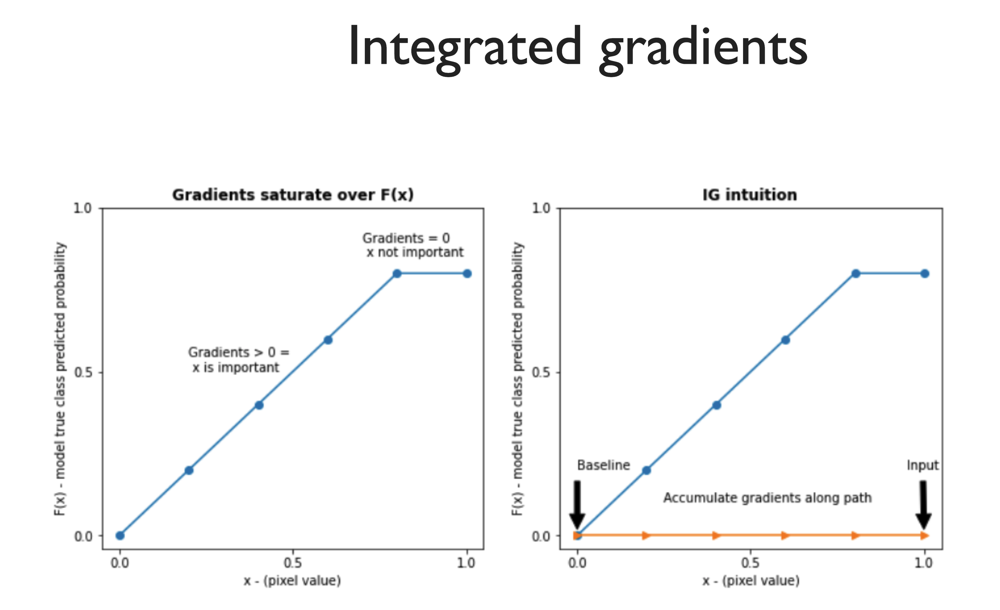

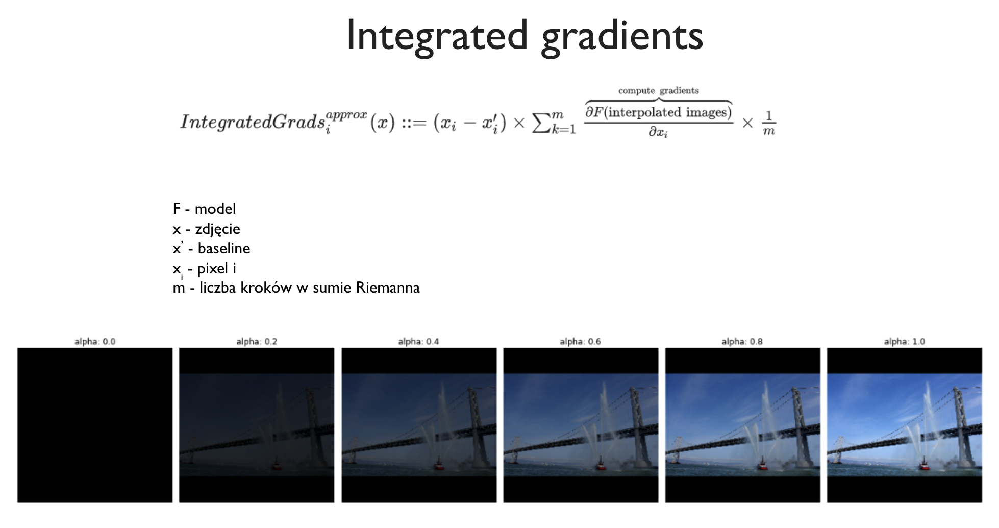

Będziemy mierzyć zmianę gradientów pomiędzy baselinem - "pustym" tekstem a oryginalnym tekstem

## Model

In [ ]:
from transformers import pipeline
clf = pipeline("sentiment-analysis")

No model was supplied, defaulted to distilbert-base-uncased-finetuned-sst-2-english and revision af0f99b (https://huggingface.co/distilbert-base-uncased-finetuned-sst-2-english).
Using a pipeline without specifying a model name and revision in production is not recommended.


config.json:   0%|          | 0.00/629 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/268M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

In [ ]:
import torch

In [ ]:
text =  "I am very excited about this project"

In [ ]:
prediction = clf(text)

In [ ]:
prediction

[{'label': 'POSITIVE', 'score': 0.9998389482498169}]

## Tokenizacja danych wejściowych

In [ ]:
inputs = torch.tensor(clf.tokenizer.encode(text, add_special_tokens=False)).unsqueeze(0)

In [ ]:
inputs

tensor([[1045, 2572, 2200, 7568, 2055, 2023, 2622]])

## Predykcja

Bierzemy sam model z pipelineu

Jako attention mask podajemy jedynki bo chcemy aby model atendował do całości sekwencji wejściowej

In [ ]:
pred = clf.model(inputs, attention_mask=torch.ones_like(inputs))

Model zwraca obieckt SequenceClassifierOutput

In [ ]:
pred

SequenceClassifierOutput(loss=None, logits=tensor([[-4.0557,  4.5426]], grad_fn=<AddmmBackward0>), hidden_states=None, attentions=None)

In [ ]:
type(pred)

transformers.modeling_outputs.SequenceClassifierOutput

https://huggingface.co/docs/transformers/v4.24.0/en/main_classes/output#transformers.modeling_outputs.SequenceClassifierOutput

Do naszej analizy potrzebujemy samych prawodopobieństw zwróconych przez model


In [ ]:
pred["logits"]

tensor([[-4.0557,  4.5426]], grad_fn=<AddmmBackward0>)

Tworzymy funkcje predukcji która przyjmuje ztokenizowany tekst wejściowy a zwraca prawodopodobieństwo

In [ ]:
def forward_function(inputs):
  return clf.model(inputs, attention_mask=torch.ones_like(inputs))['logits']

## Baseline

Kontrujemy "pusty" tekst, na początku mamy token [CLS] później wypełniamy sekwencje tokenami [PAD] a na końcu dodajemy token [SEP]

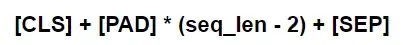

In [ ]:
inputs.shape

torch.Size([1, 7])

In [ ]:
sequence_len = inputs.shape[1]

In [ ]:
sequence_len

7

In [ ]:
baseline = torch.tensor([clf.tokenizer.cls_token_id] + [clf.tokenizer.pad_token_id] * (sequence_len - 2) + [clf.tokenizer.sep_token_id]).unsqueeze(0)



In [ ]:
baseline

tensor([[101,   0,   0,   0,   0,   0, 102]])

## Warstwa którą chcemy wyjaśnić

Model składa się z wielu warst, musimy wybrać warstę, którą chcemy wyjaśnić

In [ ]:
clf.model

DistilBertForSequenceClassification(
  (distilbert): DistilBertModel(
    (embeddings): Embeddings(
      (word_embeddings): Embedding(30522, 768, padding_idx=0)
      (position_embeddings): Embedding(512, 768)
      (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (transformer): Transformer(
      (layer): ModuleList(
        (0-5): 6 x TransformerBlock(
          (attention): MultiHeadSelfAttention(
            (dropout): Dropout(p=0.1, inplace=False)
            (q_lin): Linear(in_features=768, out_features=768, bias=True)
            (k_lin): Linear(in_features=768, out_features=768, bias=True)
            (v_lin): Linear(in_features=768, out_features=768, bias=True)
            (out_lin): Linear(in_features=768, out_features=768, bias=True)
          )
          (sa_layer_norm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
          (ffn): FFN(
            (dropout): Dropout(p=0.1, inplace=False)
 

Wybieramy warstwę embbeding

In [ ]:
clf.model.distilbert.embeddings

Embeddings(
  (word_embeddings): Embedding(30522, 768, padding_idx=0)
  (position_embeddings): Embedding(512, 768)
  (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
  (dropout): Dropout(p=0.1, inplace=False)
)

## Wyjaśnianie predykcji

In [ ]:
from captum.attr import LayerIntegratedGradients
lig = LayerIntegratedGradients(forward_function, clf.model.distilbert.embeddings)


In [ ]:
attributes, delta = lig.attribute(inputs=inputs,
                                  baselines=baseline,
                                  target = clf.model.config.label2id[prediction[0]['label']],
                                  return_convergence_delta = True)

In [ ]:
attributes.shape

torch.Size([1, 7, 768])

In [ ]:
delta

tensor([-0.7626], dtype=torch.float64)

## Wizualizacja

In [ ]:
attr_sum = attributes.sum(-1)

In [ ]:
attr_sum

tensor([[ 0.6374,  1.0297,  0.2688,  3.1306, -0.4646,  0.5581, -0.8648]],
       dtype=torch.float64)

In [ ]:
attr = attr_sum / torch.norm(attr_sum)

In [ ]:
words = clf.tokenizer.convert_ids_to_tokens(inputs.detach().numpy()[0])

In [ ]:
words

['i', 'am', 'very', 'excited', 'about', 'this', 'project']

In [ ]:
import pandas as pd
a = pd.Series(attr.numpy()[0], index = words)

In [ ]:
a

i          0.179457
am         0.289904
very       0.075689
excited    0.881437
about     -0.130817
this       0.157137
project   -0.243487
dtype: float64

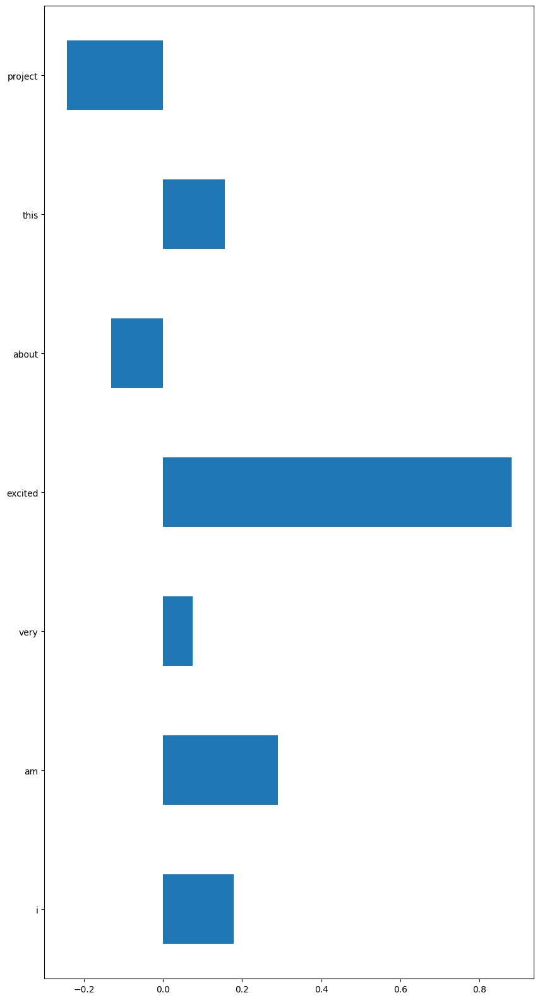

In [ ]:
import matplotlib.pyplot as plt
plt.show(a.plot.barh(figsize=(10,20)))

# Lime dla obrazów

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image
import torch.nn as nn
import numpy as np
import os, json
import torch.nn.functional as F

import torch
from torchvision import models, transforms
from skimage.segmentation import mark_boundaries

## Wczytanie zdjęcia

In [ ]:
!wget https://raw.githubusercontent.com/marcotcr/lime/master/doc/notebooks/data/dogs.png

--2023-12-09 05:05:46--  https://raw.githubusercontent.com/marcotcr/lime/master/doc/notebooks/data/dogs.png
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 376776 (368K) [image/png]
Saving to: ‘dogs.png’

dogs.png            100%[===================>] 367.95K  --.-KB/s    in 0.05s   

2023-12-09 05:05:46 (6.95 MB/s) - ‘dogs.png’ saved [376776/376776]



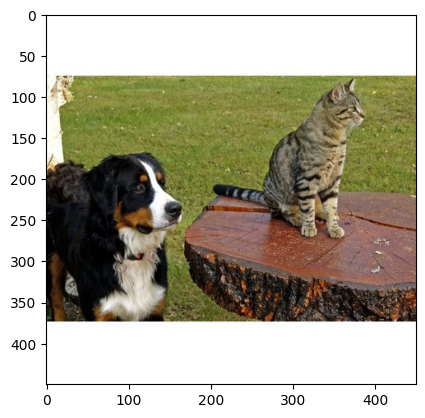

In [ ]:
def get_image(path):
    with open(os.path.abspath(path), 'rb') as f:
        with Image.open(f) as img:
            return img.convert('RGB')

img = get_image('dogs.png')
plt.imshow(img)

Lime tworzy zbiór obrazów poprzez przekształcenie oryginalnego obrazu. Potrzebujemy dostarczyć 2 rzeczy:
* oryginalny obraz w postaci macierzy numpy
* funkcje klasyfikacyjną która przyjmuje listę przekształconych obrazów i zwraca dla nich prawdopodobieństwo

## Transformacje

Potrzebujemy 2 zbiory transformacji:

1 dla oryginalnego obrazu która będzie zwracać macierz numpy

2 dla zpioru przekształconych obrazów która będzie zwracać tensor

In [ ]:
def get_pil_transform():
    transf = transforms.Compose([
        transforms.Resize((256, 256)),
        transforms.CenterCrop(224)
    ])

    return transf

def get_preprocess_transform():
    normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                    std=[0.229, 0.224, 0.225])
    transf = transforms.Compose([
        transforms.ToTensor(),
        normalize
    ])

    return transf

pill_transf = get_pil_transform()
preprocess_transform = get_preprocess_transform()

## Model

In [ ]:
model = models.inception_v3(pretrained=True)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=Inception_V3_Weights.IMAGENET1K_V1`. You can also use `weights=Inception_V3_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/inception_v3_google-0cc3c7bd.pth" to /root/.cache/torch/hub/checkpoints/inception_v3_google-0cc3c7bd.pth
100%|██████████| 104M/104M [00:00<00:00, 113MB/s] 


## Funkcja predykcji

In [ ]:
def batch_predict(images):
    model.eval()
    batch = torch.stack(tuple(preprocess_transform(i) for i in images), dim=0)

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)
    batch = batch.to(device)

    logits = model(batch)
    probs = F.softmax(logits, dim=1)
    return probs.detach().cpu().numpy()

In [ ]:
test_pred = batch_predict([pill_transf(img)])
test_pred.squeeze().argmax()

239

## Wyjaśnianie

In [ ]:
from lime import lime_image

In [ ]:
explainer = lime_image.LimeImageExplainer()
explanation = explainer.explain_instance(np.array(pill_transf(img)),
                                         batch_predict, # classification function
                                         top_labels=5,
                                         hide_color=0,
                                         num_samples=1000) # numbe

  0%|          | 0/1000 [00:00<?, ?it/s]

## Wizualizacja

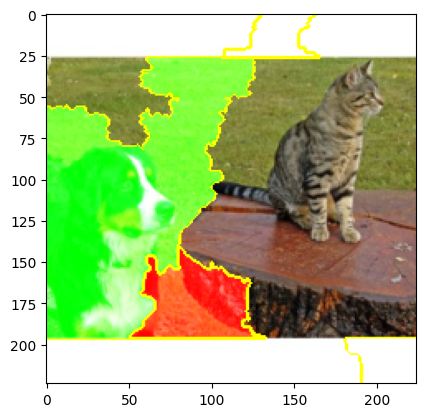

In [ ]:
temp, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=False, num_features=10, hide_rest=False)
img_boundry = mark_boundaries(temp/255.0, mask)
plt.imshow(img_boundry)

# Shap dla tekstu

In [ ]:
import transformers
import shap

In [ ]:
tokenizer = transformers.AutoTokenizer.from_pretrained("nateraw/bert-base-uncased-emotion", use_fast=True)
model = transformers.AutoModelForSequenceClassification.from_pretrained("nateraw/bert-base-uncased-emotion")

# build a pipeline object to do predictions
clf = transformers.pipeline("text-classification", model=model, tokenizer=tokenizer, return_all_scores=True)

tokenizer_config.json:   0%|          | 0.00/252 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/768 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/438M [00:00<?, ?B/s]

`return_all_scores` is now deprecated,  if want a similar functionality use `top_k=None` instead of `return_all_scores=True` or `top_k=1` instead of `return_all_scores=False`.


In [ ]:
explainer = shap.Explainer(clf)

In [ ]:
shap_values = explainer(["i can go from feeling so hopeless to so damned hopeful just from being around someone who cares and is awake"])

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [01:05, 65.84s/it]               


In [ ]:
shap.plots.text(shap_values)

# Zadania

## 1. Zaimplementuj wyjaśnialnośc dla modelu wykrywania cyberbullingu

https://huggingface.co/ptaszynski/bert-base-polish-cyberbullying korzystając z biblioteki shap. Przetestuj wyniki modelu na zbiorze  https://huggingface.co/datasets/poleval2019_cyberbullying

In [ ]:
!pip install datasets

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 521.2/521.2 kB 8.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 115.3/115.3 kB 13.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 11.1 MB/s eta 0:00:00


In [ ]:
import datasets

In [ ]:
dataset  = datasets.load_dataset("poleval2019_cyberbullying",'task01', split = "test")

Generating train split:   0%|          | 0/10041 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/1000 [00:00<?, ? examples/s]

In [ ]:
texts = dataset["text"]

### 1.1 Wyczyść zbiór danych z tagów `@anonymized_account`

In [ ]:
data = [text.replace('@anonymized_account', '') for text in texts] # TODO: Przefiltruj listę texts, zamień tagi anonymized account na pusty string

In [ ]:
model_path = "ptaszynski/bert-base-polish-cyberbullying"
clf = transformers.pipeline('text-classification', model=model_path, return_all_scores=True)

In [ ]:
data[:20]

[' Spoko, jak im Duda z Morawieckim zamówią po pięć piw to wszystko będzie ok.',
 "  Ale on tu nie miał szans jej zagrania, a ta 'proba' to czysta prowizorka.",
 ' No czy Prezes nie miał racji, mówiąc,ze to są zdradzieckie mordy? No czy nie miał racji?😁😁',
 '  Przecież to nawet nie jest przewrotka 😂',
 '  Owszem podatki tak. Ale nie w takich okolicznościach. Czemu Małysza odpalili z teamu Orlen?',
 '  skąd wiesz jaki Skendija ma budżet skoro mówisz że jest bogatsza ? Tylko dwóch zawodników ponoć dobrze zarabia.',
 'Z tego, co widzę, to kibice Widzewa mają szczęście, że trwa mundial. Dzięki temu ogólnopolska szydera jest tylko z Argentyny i Messiego.',
 '   Na utrzymanie własnej armii 2% PKB, tyle że teraz to jedna wielka ściema',
 'Przypomnijcie mi ze muszę jeszcze suszarkę spakować',
 'Czy Adam już nie żyje? Jeśli tak, to jak rozwiązali jego wątek?  #nadobreinazłe',
 ' Nie zmieścił się w kadrze to dostał wolne, bo przecież teraz będzie przerwa na kadrę.',
 'Jajka na miękko czy na twar

### 1.2 Zaimplementuj wyjaśnianie

In [ ]:
import transformers
import shap

In [ ]:
model_path = "ptaszynski/bert-base-polish-cyberbullying"
clf = transformers.pipeline('text-classification', model=model_path, return_all_scores=True) # Wczytaj pipeline do klasyfikacji tekstów z podanym wyżej modelem i tokenizatorem
# Ustaw parametr return_all_scores na True

In [ ]:
explainer = shap.Explainer(clf) # zaimplementuj explainer do klasyfikatora zdefiniowanego wyżej

In [ ]:
shap_values = explainer(data[:20]) # TODO oblicz shap values dla pierwszych 20 przykładó

  0%|          | 0/380 [00:00<?, ?it/s]

PartitionExplainer explainer:   5%|▌         | 1/20 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  15%|█▌        | 3/20 [02:48<11:04, 39.10s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  20%|██        | 4/20 [04:24<16:47, 63.00s/it]

  0%|          | 0/90 [00:00<?, ?it/s]

PartitionExplainer explainer:  25%|██▌       | 5/20 [04:31<10:32, 42.15s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  30%|███       | 6/20 [06:16<14:52, 63.77s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  35%|███▌      | 7/20 [07:45<15:40, 72.35s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  40%|████      | 8/20 [09:31<16:36, 83.07s/it]

  0%|          | 0/306 [00:00<?, ?it/s]

PartitionExplainer explainer:  45%|████▌     | 9/20 [10:06<12:29, 68.11s/it]

  0%|          | 0/156 [00:00<?, ?it/s]

PartitionExplainer explainer:  50%|█████     | 10/20 [10:21<08:34, 51.46s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  55%|█████▌    | 11/20 [11:39<08:58, 59.81s/it]

  0%|          | 0/462 [00:00<?, ?it/s]

PartitionExplainer explainer:  60%|██████    | 12/20 [12:52<08:30, 63.76s/it]

  0%|          | 0/272 [00:00<?, ?it/s]

PartitionExplainer explainer:  65%|██████▌   | 13/20 [13:24<06:19, 54.15s/it]

  0%|          | 0/306 [00:00<?, ?it/s]

PartitionExplainer explainer:  70%|███████   | 14/20 [14:15<05:17, 52.96s/it]

  0%|          | 0/110 [00:00<?, ?it/s]

PartitionExplainer explainer:  75%|███████▌  | 15/20 [14:24<03:19, 39.81s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  80%|████████  | 16/20 [15:44<03:27, 51.81s/it]

  0%|          | 0/462 [00:00<?, ?it/s]

PartitionExplainer explainer:  85%|████████▌ | 17/20 [16:50<02:48, 56.31s/it]

  0%|          | 0/110 [00:00<?, ?it/s]

PartitionExplainer explainer:  90%|█████████ | 18/20 [17:07<01:28, 44.26s/it]

  0%|          | 0/72 [00:00<?, ?it/s]

PartitionExplainer explainer:  95%|█████████▌| 19/20 [17:17<00:34, 34.19s/it]

  0%|          | 0/72 [00:00<?, ?it/s]

PartitionExplainer explainer: 100%|██████████| 20/20 [17:28<00:00, 27.16s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer: 21it [18:48, 56.44s/it]


In [ ]:
shap.plots.text(shap_values) # TODO wyświetl wykres ilustrujący istotność cech na podstawie shap values

## 2. Przeanalizuj model catboost do predykcji cukrzycy z wykorzystaniem biblioteki shap

CatBoost jest modelem bazującym na drzewach, skorzystaj z https://shap.readthedocs.io/en/latest/generated/shap.explainers.Tree.html#shap.explainers.Tree

In [ ]:
!pip install catboost

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.7/98.7 MB 2.4 MB/s eta 0:00:00


In [ ]:
import catboost
from catboost import *

In [ ]:
X,y = shap.datasets.diabetes()

In [ ]:
model = CatBoostRegressor(iterations=300, learning_rate=0.1, random_seed=123)
model.fit(X, y, verbose=False, plot=False)

### 2.1 Stwórz explainer

In [ ]:
explainer = shap.TreeExplainer(model) # wczytaj explainer do modeli bazujących na drzewach
shap_values = explainer.shap_values(X) # TODO oblicz shap values dla całego X

### 2.2 Oceń który czynnik jest najważniejszy dla klasyfikacji z wykorzystanie summary plot

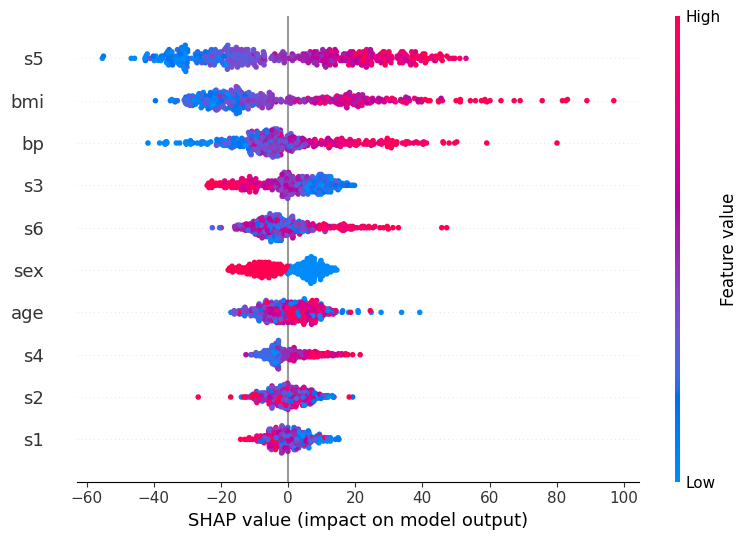

In [ ]:
shap.summary_plot(shap_values, X) # 2.2 TODO

### 2.3 Oceń jak BMI wpływa na ryzyko cukrzycy z wykorzystaniem dependency plot

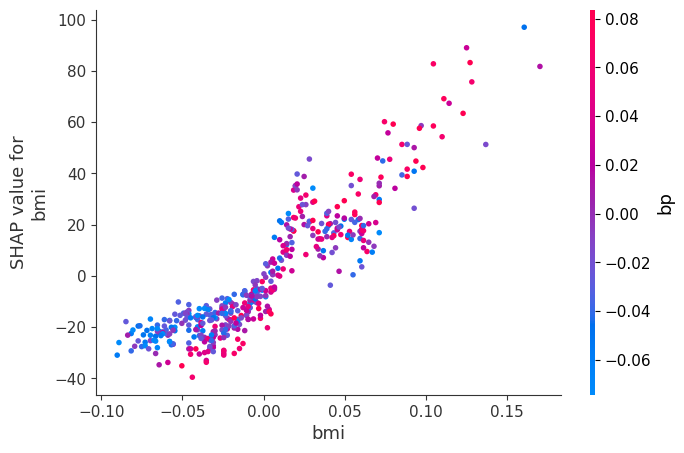

In [ ]:
shap.dependence_plot("bmi", shap_values, X)

## 3. Przenalizuj obrazy kotów i psów za pomocą metody Guided GradCAM i funkcji do obsługi obrazów zdefiniowanych w sekcji CAPTUM - Integrated Gradients

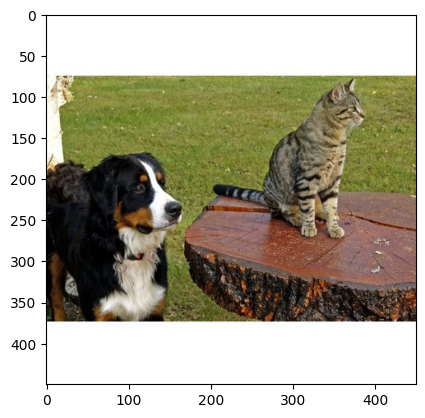

In [ ]:
plt.imshow(img)

In [ ]:
pill_transf = get_pil_transform()
preprocess_transform = get_preprocess_transform()

In [ ]:
torch.jit.is_scripting()

False

In [ ]:
# Wczytaj model inception v3
model = models.inception_v3(pretrained=True)

The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=Inception_V3_Weights.IMAGENET1K_V1`. You can also use `weights=Inception_V3_Weights.DEFAULT` to get the most up-to-date weights.


3.1 Sprawdź, które elementy obrazu miały największy wpływ na zaklasyfikowanie obrazu do danej klasy. Skorzystaj z modułu Guided GradCAM w bibliotece CAPTUM. Guided Grad-CAM zwraca wizualizację najbardziej aktywnych neuronów w danej warstwie. Uważa się, że najlepiej jest zwizualizować ostatnią warstwę splotową

GradCAM zwraca osobny wynik dla każdej klasy. Zazwyczaj interesuje nas tylko wynik dla klasy, która jest najbardziej prawdopodobna według modelu.

In [ ]:
model.training = False

In [ ]:
for name, module in model.named_modules():
    print(name) # wyświetl nazwy warstw modelu


Conv2d_1a_3x3
Conv2d_1a_3x3.conv
Conv2d_1a_3x3.bn
Conv2d_2a_3x3
Conv2d_2a_3x3.conv
Conv2d_2a_3x3.bn
Conv2d_2b_3x3
Conv2d_2b_3x3.conv
Conv2d_2b_3x3.bn
maxpool1
Conv2d_3b_1x1
Conv2d_3b_1x1.conv
Conv2d_3b_1x1.bn
Conv2d_4a_3x3
Conv2d_4a_3x3.conv
Conv2d_4a_3x3.bn
maxpool2
Mixed_5b
Mixed_5b.branch1x1
Mixed_5b.branch1x1.conv
Mixed_5b.branch1x1.bn
Mixed_5b.branch5x5_1
Mixed_5b.branch5x5_1.conv
Mixed_5b.branch5x5_1.bn
Mixed_5b.branch5x5_2
Mixed_5b.branch5x5_2.conv
Mixed_5b.branch5x5_2.bn
Mixed_5b.branch3x3dbl_1
Mixed_5b.branch3x3dbl_1.conv
Mixed_5b.branch3x3dbl_1.bn
Mixed_5b.branch3x3dbl_2
Mixed_5b.branch3x3dbl_2.conv
Mixed_5b.branch3x3dbl_2.bn
Mixed_5b.branch3x3dbl_3
Mixed_5b.branch3x3dbl_3.conv
Mixed_5b.branch3x3dbl_3.bn
Mixed_5b.branch_pool
Mixed_5b.branch_pool.conv
Mixed_5b.branch_pool.bn
Mixed_5c
Mixed_5c.branch1x1
Mixed_5c.branch1x1.conv
Mixed_5c.branch1x1.bn
Mixed_5c.branch5x5_1
Mixed_5c.branch5x5_1.conv
Mixed_5c.branch5x5_1.bn
Mixed_5c.branch5x5_2
Mixed_5c.branch5x5_2.conv
Mixed_5c.bra

In [ ]:
last_layer = model.fc #  TODO ustal jak nazywa się ostatnia warstwa splotowa i jak się do niej dostać w hierarchii modelu
print(last_layer)

Linear(in_features=2048, out_features=1000, bias=True)


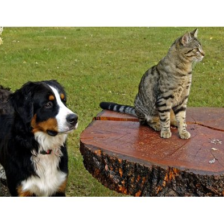

In [ ]:
pill_transf(img)

In [ ]:
from torchvision import transforms

transform = transforms.Compose([
    transforms.ToTensor()
])
img_tensor = transform(img)
img_tensor = torch.unsqueeze(img_tensor, dim=0)

In [ ]:
test_pred = model(img_tensor)
test_pred

InceptionOutputs(logits=tensor([[-2.0874e-01, -8.3954e-02, -8.8160e-01, -2.0604e-01, -4.2485e-01,
         -7.7743e-01, -1.9295e-01, -1.1187e+00, -8.8762e-01, -3.4977e-01,
          3.6707e-01,  6.2872e-01, -5.7697e-02,  1.2051e-01,  7.0574e-01,
         -5.5773e-01, -2.9931e-01, -3.4516e-01,  2.1627e-02, -5.1955e-02,
         -7.2114e-02, -2.9099e-01,  4.3229e-02, -2.8301e-01, -4.6935e-01,
         -7.7182e-01, -3.8488e-01, -4.6082e-01, -4.6253e-01,  2.2359e-01,
         -2.6113e-01,  2.1505e-01, -7.3198e-01,  2.8922e-01,  9.0513e-01,
         -2.9315e-01, -1.0320e+00,  7.2864e-02, -2.2126e-01,  2.6581e-01,
          9.5763e-01,  1.8296e-01, -1.0316e-01,  6.5799e-01, -1.6349e-02,
         -4.1712e-01, -7.5398e-01,  1.1780e+00, -2.6187e-01,  3.5585e-01,
         -2.2223e-01,  1.5441e-01,  2.0330e-01, -3.2177e-01, -2.6244e-01,
         -4.4829e-01, -1.3073e+00,  5.3807e-02, -6.7270e-02,  4.4374e-01,
         -4.5643e-01, -1.5602e-01,  4.0797e-01, -1.4503e-01,  3.8005e-01,
         -2.99

In [ ]:
# TODO:
test_pred.logits.squeeze().argmax()

tensor(885)

In [ ]:
lambda x: model(x).logits

<function __main__.<lambda>(x)>

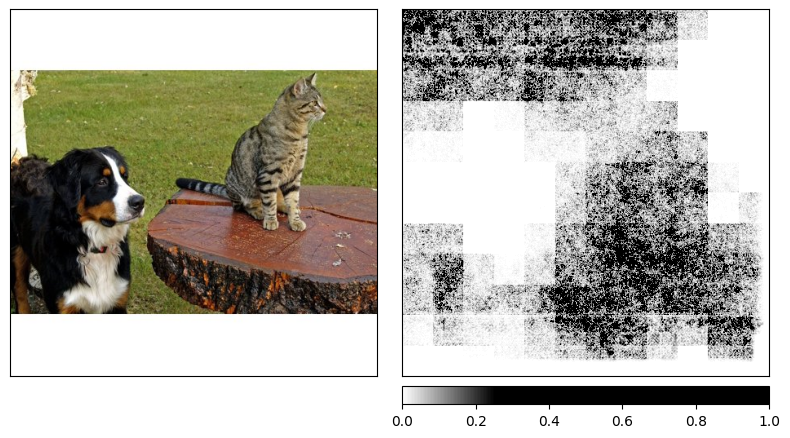

(<Figure size 800x600 with 4 Axes>, array([<Axes: >, <Axes: >], dtype=object))

In [ ]:
from captum.attr import GuidedGradCam
guided_gc = GuidedGradCam(model, model.Mixed_7c.branch_pool.conv)
attribution = guided_gc.attribute(img_tensor, 587)
# plt.imshow(transforms.ToPILImage(attribution.squeeze(0)))
from captum.attr import visualization as viz
from matplotlib.colors import LinearSegmentedColormap

default_cmap = LinearSegmentedColormap.from_list('custom blue',
                                                 [(0, '#ffffff'),
                                                  (0.25, '#000000'),
                                                  (1, '#000000')], N=256)
viz.visualize_image_attr_multiple(np.transpose(attribution.squeeze().cpu().detach().numpy(), (1,2,0)),
                                      np.transpose(img_tensor.squeeze().cpu().detach().numpy(), (1,2,0)),
                                      ["original_image", "heat_map"],
                                      ["all", "absolute_value"],
                                      cmap=default_cmap,
                                      show_colorbar=True)

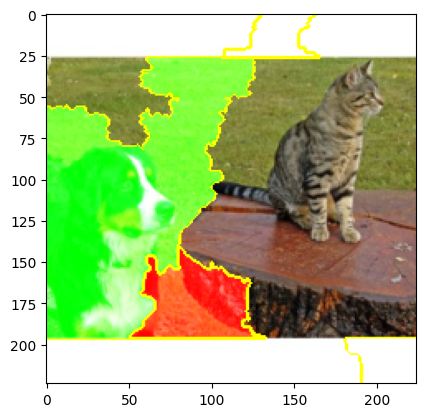

In [ ]:
temp, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=False, num_features=10, hide_rest=False)
img_boundry = mark_boundaries(temp/255.0, mask)
plt.imshow(img_boundry)